****
# 👉 Introduction and Goal
**** 
*Author: Samanyu* <br>
*Language: Python* <br>
*Accelerator: None* <br>
**Goal: Predict probability of Ranifall**

****
# 📖 Reading and Displaying data #
****

In [1]:
# importing
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r'/kaggle/input/playground-series-s5e3/train.csv')
te=pd.read_csv(r'/kaggle/input/playground-series-s5e3/test.csv')
print(df.shape,te.shape)

(2190, 13) (730, 12)


In [3]:
df

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1
2,2,3,1024.1,19.4,16.1,14.6,9.3,75.0,47.0,8.3,70.0,18.1,1
3,3,4,1013.4,18.1,17.8,16.9,16.8,95.0,95.0,0.0,60.0,35.6,1
4,4,5,1021.8,21.3,18.4,15.2,9.6,52.0,45.0,3.6,40.0,24.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2185,2185,361,1014.6,23.2,20.6,19.1,19.9,97.0,88.0,0.1,40.0,22.1,1
2186,2186,362,1012.4,17.2,17.3,16.3,15.3,91.0,88.0,0.0,50.0,35.3,1
2187,2187,363,1013.3,19.0,16.3,14.3,12.6,79.0,79.0,5.0,40.0,32.9,1
2188,2188,364,1022.3,16.4,15.2,13.8,14.7,92.0,93.0,0.1,40.0,18.0,1


In [4]:
te

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed
0,2190,1,1019.5,17.5,15.8,12.7,14.9,96.0,99.0,0.0,50.0,24.3
1,2191,2,1016.5,17.5,16.5,15.8,15.1,97.0,99.0,0.0,50.0,35.3
2,2192,3,1023.9,11.2,10.4,9.4,8.9,86.0,96.0,0.0,40.0,16.9
3,2193,4,1022.9,20.6,17.3,15.2,9.5,75.0,45.0,7.1,20.0,50.6
4,2194,5,1022.2,16.1,13.8,6.4,4.3,68.0,49.0,9.2,20.0,19.4
...,...,...,...,...,...,...,...,...,...,...,...,...
725,2915,361,1020.8,18.2,17.6,16.1,13.7,96.0,95.0,0.0,20.0,34.3
726,2916,362,1011.7,23.2,18.1,16.0,16.0,78.0,80.0,1.6,40.0,25.2
727,2917,363,1022.7,21.0,18.5,17.0,15.5,92.0,96.0,0.0,50.0,21.9
728,2918,364,1014.4,21.0,20.0,19.7,19.8,94.0,93.0,0.0,50.0,39.5


****
# 🔫 Data Preprocessing #
****

In [5]:
# importing
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
# We have no null values
# Let us drop duplicates and then drop the Id column
df.drop_duplicates(inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2190 entries, 0 to 2189
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             2190 non-null   int64  
 1   day            2190 non-null   int64  
 2   pressure       2190 non-null   float64
 3   maxtemp        2190 non-null   float64
 4   temparature    2190 non-null   float64
 5   mintemp        2190 non-null   float64
 6   dewpoint       2190 non-null   float64
 7   humidity       2190 non-null   float64
 8   cloud          2190 non-null   float64
 9   sunshine       2190 non-null   float64
 10  winddirection  2190 non-null   float64
 11  windspeed      2190 non-null   float64
 12  rainfall       2190 non-null   int64  
dtypes: float64(10), int64(3)
memory usage: 222.5 KB


In [7]:
df.fillna(df.mean(), inplace=True)
te.fillna(te.mean(), inplace=True)

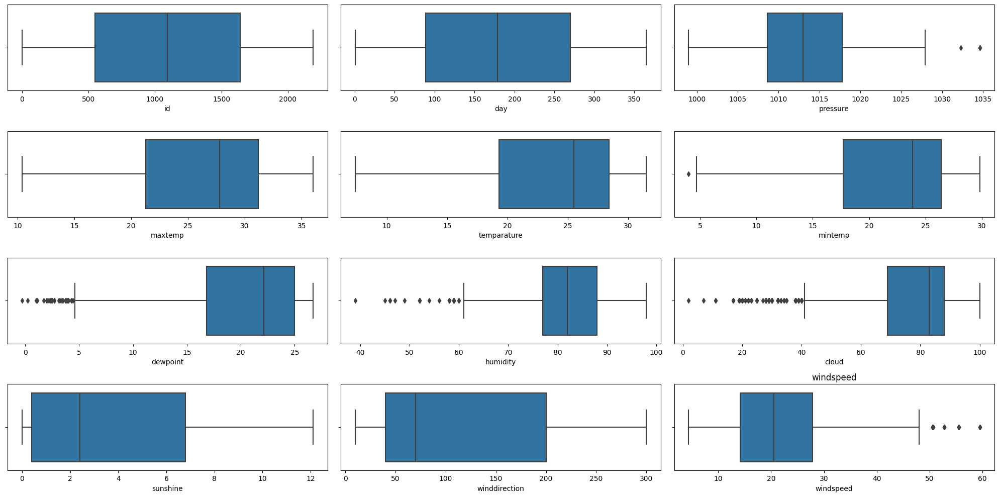

In [8]:
fig,ax=plt.subplots(4,3,figsize=(20,10))
ax=ax.flatten()
i=0
for cols in df.columns:
    if i<len(ax):
        sns.boxplot(data=df,x=df[cols],ax=ax[i])
        plt.title(cols)
        i+=1
plt.tight_layout()
plt.show()

In [9]:
# We do have some outliers let us see how this will affect the model
# No duplicates
# No null values
# Let us visualize these features

****
# 📺 Data Visualization
****

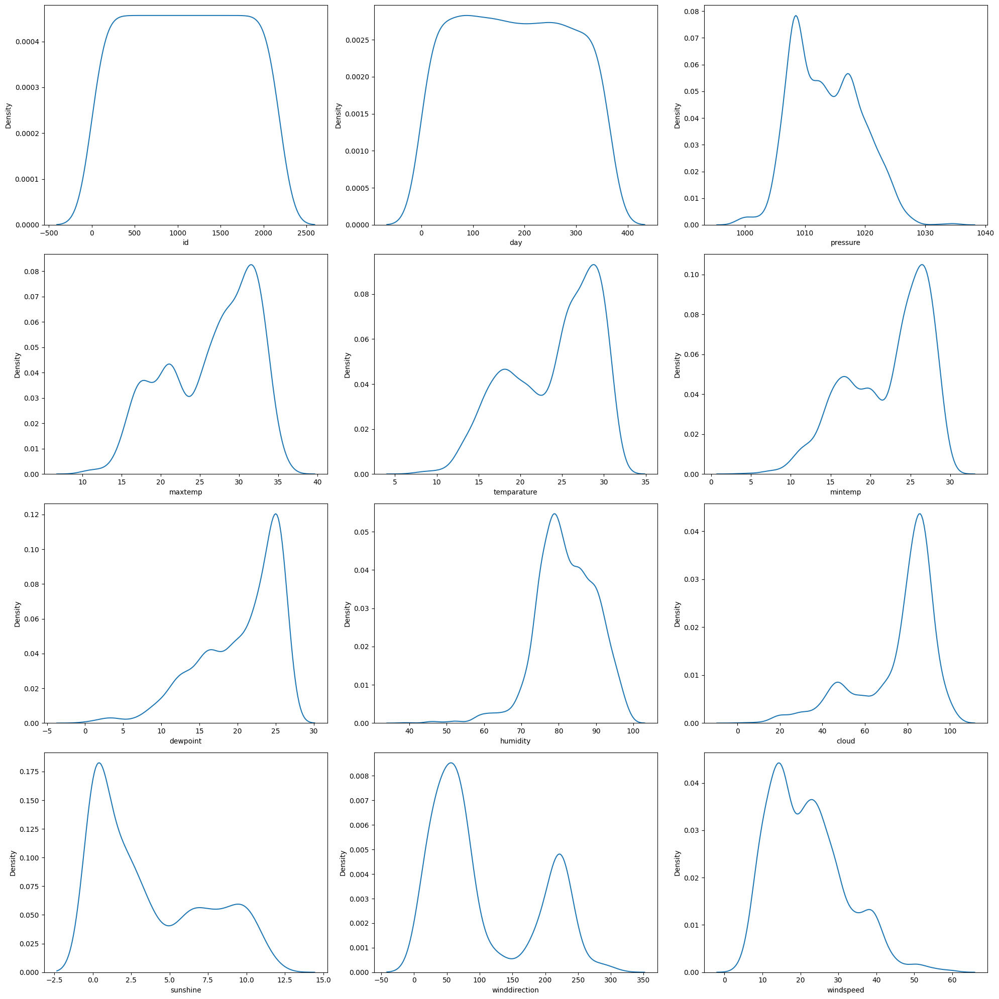

In [10]:
# Let us use kde plots to check the distribution of the features as well as our target variable
fig,ax=plt.subplots(4,3,figsize=(20,20))
ax=ax.flatten()
i=0
for col in df.columns:
    if i <len(ax):
        sns.kdeplot(data=df,x=df[col],ax=ax[i])
        i+=1
plt.tight_layout()
plt.show()


* The dataset shows clear seasonal trends in temperature and dew point, with multimodal distributions indicating variations across different periods.
* Pressure follows a somewhat normal distribution but with slight skewness, suggesting periods of high and low pressure events.
* Maximum and minimum temperature distributions indicate distinct peaks, likely corresponding to different climatic conditions or seasons.
* The day variable appears to be uniformly distributed, likely covering a full year of data.
* Multimodal patterns in temperature-related variables suggest distinct weather regimes (e.g., summer vs. winter).
* Humidity and Cloud Cover: Both show right-skewed distributions with peaks around 80-90%, indicating that most of the observations are in a high-humidity and high-cloud conditions.
* Sunshine Duration: The distribution is bimodal, with a significant peak near 0 and another at higher values, suggesting a mix of cloudy and clear days.
* Wind Speed: The distribution is skewed towards lower values, meaning most days have relatively low wind speeds, but some have higher gusts.
* Wind Direction: Shows multiple peaks, which might indicate predominant wind directions at specific times.

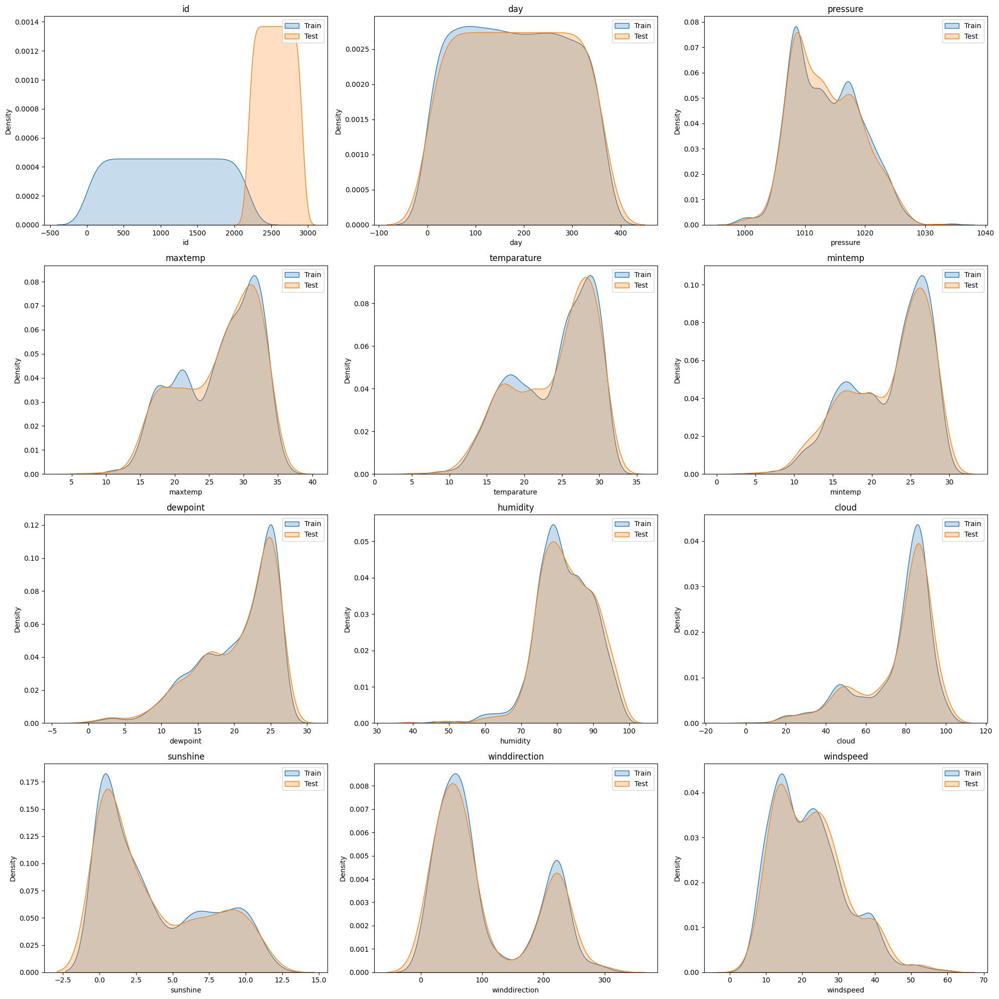

In [11]:
# let us compare train and test data and look at that distributions

fig, ax = plt.subplots(4, 3, figsize=(20, 20))
ax = ax.flatten()
i = 0
for col in df.columns:
    if col != 'rainfall':
        sns.kdeplot(data=df, x=col, ax=ax[i], label="Train", fill=True)
        sns.kdeplot(data=te, x=col, ax=ax[i], label="Test", fill=True)
        ax[i].set_title(col)
        ax[i].legend()
        i += 1
plt.tight_layout()

for j in range(i, len(ax)):
    ax[j].axis("off")

plt.show()


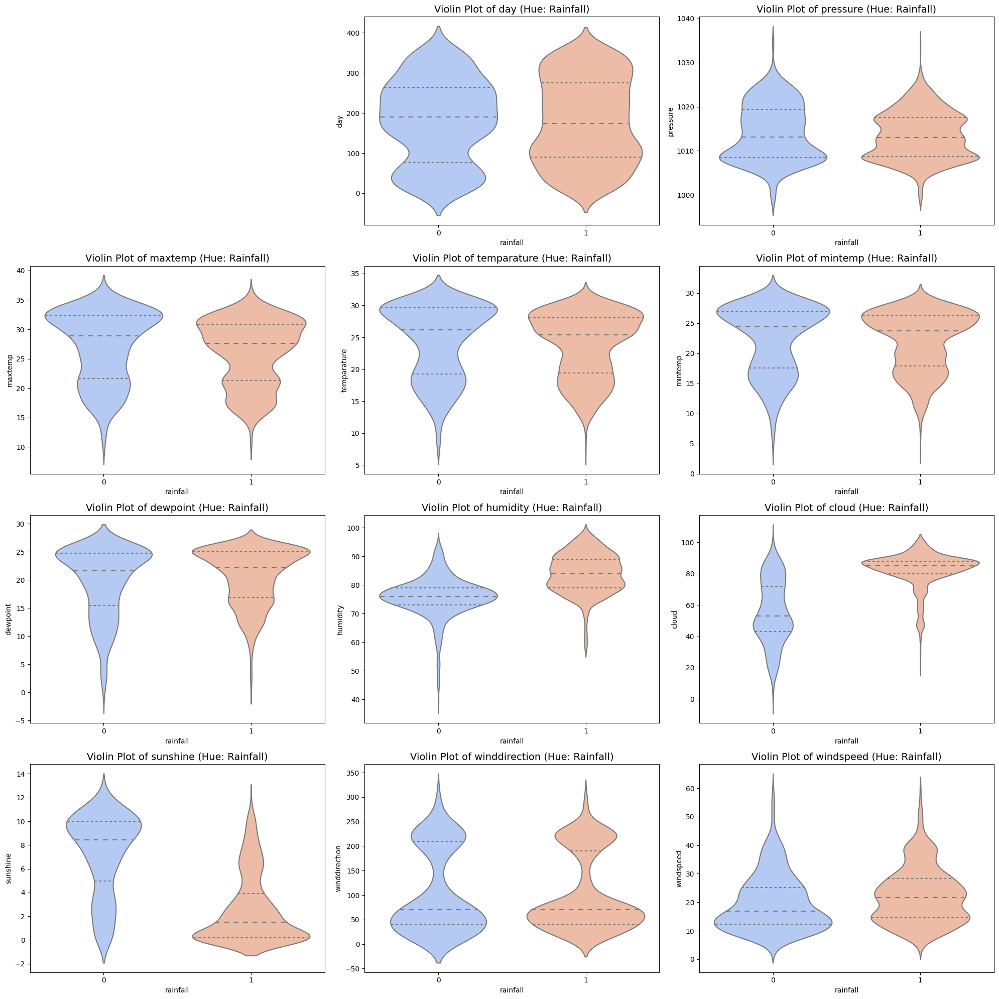

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(4, 3, figsize=(20, 20))
ax = ax.flatten()

for i, col in enumerate(df.columns):
    if col not in ['id', 'rainfall']:
        sns.violinplot(data=df, y=col, x='rainfall', ax=ax[i], inner="quartile", palette="coolwarm")
        ax[i].set_title(f'Violin Plot of {col} (Hue: Rainfall)', fontsize=14)

ax[0].axis('off')
plt.tight_layout()
plt.show()


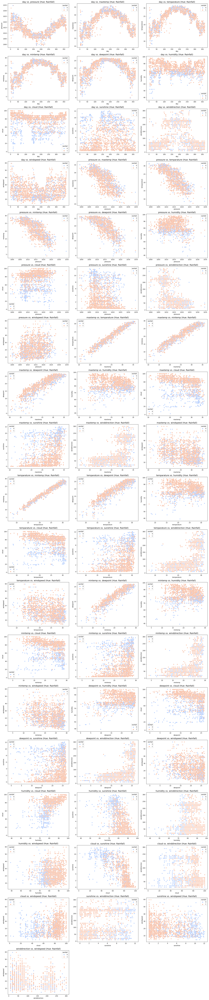

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

features = ['day', 'pressure', 'maxtemp', 'temparature', 'mintemp', 'dewpoint', 
            'humidity', 'cloud', 'sunshine', 'winddirection', 'windspeed']
pairs = list(itertools.combinations(features, 2))  
n_cols = 3
n_rows = -(-len(pairs) // n_cols)  

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()
for i, (x, y) in enumerate(pairs):
    sns.scatterplot(data=df, x=x, y=y, hue='rainfall', palette='coolwarm', ax=axes[i])
    axes[i].set_title(f'{x} vs. {y} (Hue: Rainfall)', fontsize=14)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


****
# ⚙️ Feature Engineering
****

**Some basic features which you can implement:**<br>
1. df['temp_range'] = df['maxtemp'] - df['mintemp']
2. df['temp_dew_diff'] = df['temparature'] - df['dewpoint']
3. df['humidity_pressure_ratio'] = df['humidity'] / (df['pressure'] + 1e-6
4. df['wind_pressure_interaction'] = df['windspeed']*df['pressure']
5. df['cloud_temp_interaction'] = df['cloud'] * df['temparature']


**⚠️ Note: No feature engineering will be done in this notebook, we will look at how far up the leaderboard we will go without extra features**

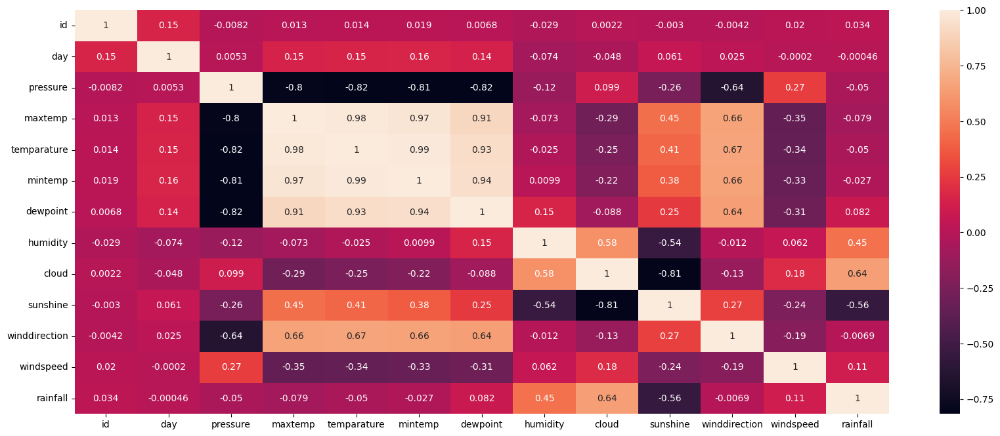

In [14]:
# Let us visualize correlation values using a heatmap
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(),annot=True)
plt.show()

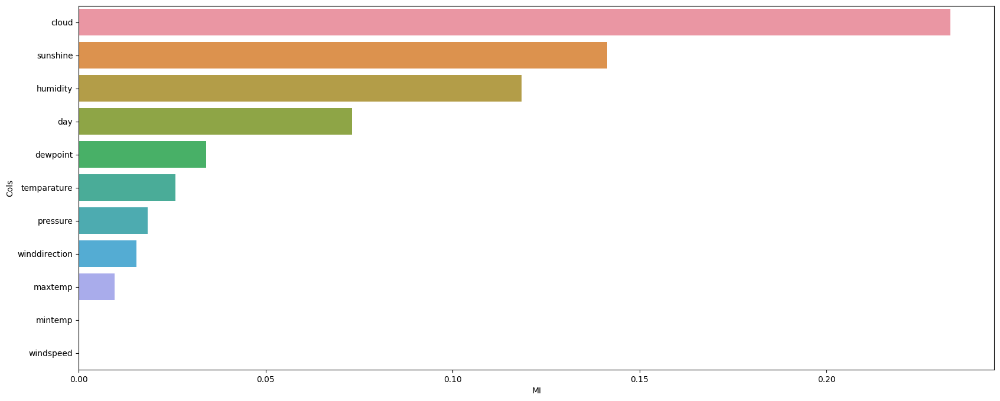

In [15]:
# Calculating Mutual Information
# importing
from sklearn.feature_selection import mutual_info_regression

X = df.drop(columns=['id', 'rainfall'])
y = df['rainfall']
mi=mutual_info_regression(X,y)
mi_df=pd.DataFrame({"Cols":X.columns,'MI':mi})
mi_df.sort_values(ascending=False,inplace=True,by='MI')

plt.figure(figsize=(20,8))
sns.barplot(data=mi_df,x='MI',y='Cols')
plt.show()

****
# 🔨 Data Preparation
****

In [16]:
X = df.drop(columns=['id', 'rainfall'])
y = df['rainfall']
X_test = te.drop(columns=['id'])

****
# ✌️Normalizing and Reshaping the Data
****

In [17]:
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Flatten, Dense, Dropout, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split

In [18]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_test_scaled = scaler.transform(X_test)

# Reshape Input for CNN (adding a channel dimension)
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_val = X_val.reshape((X_val.shape[0], X_val.shape[1], 1))
X_test_scaled = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

*****
# 🧠 CNN???
****

In [19]:
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=32, kernel_size=3, activation='relu'),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(1, activation='linear')  
])

optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-5, verbose=1)


history = model.fit(
    X_train, y_train, 
    epochs=200, batch_size=32, validation_data=(X_val, y_val), 
    callbacks=[early_stopping, reduce_lr], verbose=1
)




Epoch 1/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3101 - mae: 0.4863 - val_loss: 0.1300 - val_mae: 0.2915 - learning_rate: 0.0010
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1218 - mae: 0.2792 - val_loss: 0.1209 - val_mae: 0.2491 - learning_rate: 0.0010
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1126 - mae: 0.2473 - val_loss: 0.1232 - val_mae: 0.2571 - learning_rate: 0.0010
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1230 - mae: 0.2581 - val_loss: 0.1259 - val_mae: 0.2728 - learning_rate: 0.0010
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1055 - mae: 0.2332 - val_loss: 0.1173 - val_mae: 0.2355 - learning_rate: 0.0010
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1010 - mae: 0.2201 - val_loss: 0.1259 - val_mae: 0.2665 - learning_rate: 0.0010
Epoch 7/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1056 - mae: 0.2309 - val_loss: 0.1232 - val_mae: 0.2771 - learning_rate: 0.0010
Epoch 8/200
5

****
# 🔮 Prediction
****

In [20]:
test_preds = model.predict(X_test_scaled).flatten()

if np.isnan(test_preds).sum() > 0:
    print(f"Found {np.isnan(test_preds).sum()} NaN values in predictions. Fixing them...")
    test_preds = np.nan_to_num(test_preds)  

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


****
# 🏆Submission
****

In [21]:
submission = pd.DataFrame({"id": te['id'], "rainfall": test_preds})
submission.to_csv("submission.csv", index=False)

print("Successfully Saved Raaaaaaahhhhhh!!!")

Successfully Saved Raaaaaaahhhhhh!!!
